In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# End-to-End Multi-class Dog Classification 🐶
1. Problem 
Identifying the breed of a dog given an image of a dog
2. Data
Kaggle Drog breed competition data:
https://www.kaggle.com/competitions/dog-breed-identification/data
3. Evaluation 
Prediction Probablites for each dog breed of each test image
10,000+ images in Training Set (Contains Labels) 10,000+ images in Test Set (No labels)



1. Import Tensorflow
2. Import Tensorflow Hub
3. Make Sure that GPU is being used

TensorFlow Allows us to write code which gets executed in GPU

TensorFlow Hub is a repository of trained machine learning models ready for fine-tuning and deployable anywhere. Reuse trained models like BERT and Faster R-CNN with just a few lines of code.

In [10]:
!pip install --upgrade tensorflow_hub


In [11]:
import sys
import tensorflow.keras
import pandas as pd
import sklearn as sk
import scipy as sp
import tensorflow as tf
import tensorflow_hub as hub
import platform
print(f"Python Platform: {platform.platform()}")
print(f"Tensor Flow Version: {tf.__version__}")
print(f"Tensor Flow Hub Version: {hub.__version__}")
print(f"Keras Version: {tensorflow.keras.__version__}")
print()
print(f"Python {sys.version}")
print(f"Pandas {pd.__version__}")
print(f"Scikit-Learn {sk.__version__}")
print(f"SciPy {sp.__version__}")
gpu = len(tf.config.list_physical_devices('GPU'))>0
print("GPU is", "available" if gpu else "NOT AVAILABLE")

Python Platform: macOS-13.0.1-arm64-arm-64bit
Tensor Flow Version: 2.12.0
Tensor Flow Hub Version: 0.13.0
Keras Version: 2.12.0

Python 3.10.9 (main, Mar  1 2023, 12:20:14) [Clang 14.0.6 ]
Pandas 2.0.1
Scikit-Learn 1.2.2
SciPy 1.10.1
GPU is available


# Getting our Data ready (Turning into Tensors)
 With all machine Learning models our data needs to be in numerical format. Turning our images into Tensors (Numerical Representation)

In [12]:
import pandas as pd
data_label=pd.read_csv("labels.csv")
print(data_label.describe())
print(data_label.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: xlabel='breed'>

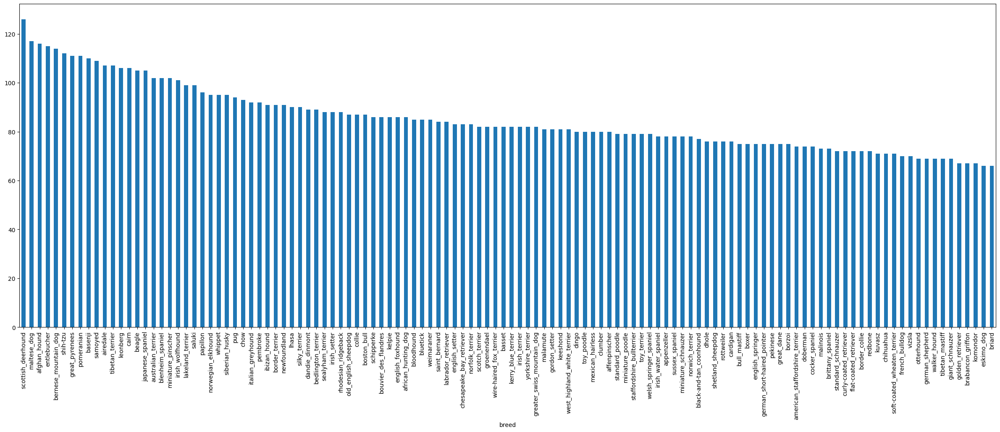

In [13]:
data_label["breed"].value_counts().plot.bar(figsize=(30,10))

In [14]:
data_label["breed"].value_counts().median()

82.0

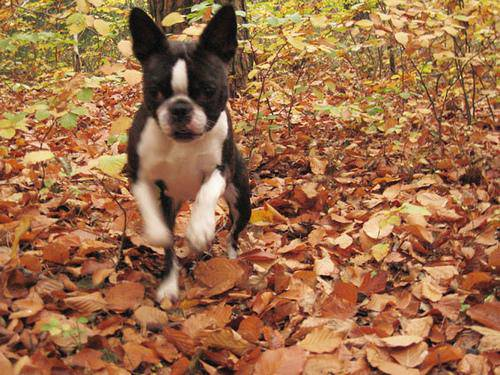

In [15]:
from IPython.display import Image
Image("train/000bec180eb18c7604dcecc8fe0dba07.jpg")

In [16]:
data_label.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [17]:
filenames=["train/" +fname+".jpg"  for fname in data_label["id"]] 
# Create a list fname for fname in data label id
filenames[:10]

['train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'train/001cdf01b096e06d78e9e5112d419397.jpg',
 'train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'train/002a283a315af96eaea0e28e7163b21b.jpg',
 'train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'train/0042188c895a2f14ef64a918ed9c7b64.jpg']

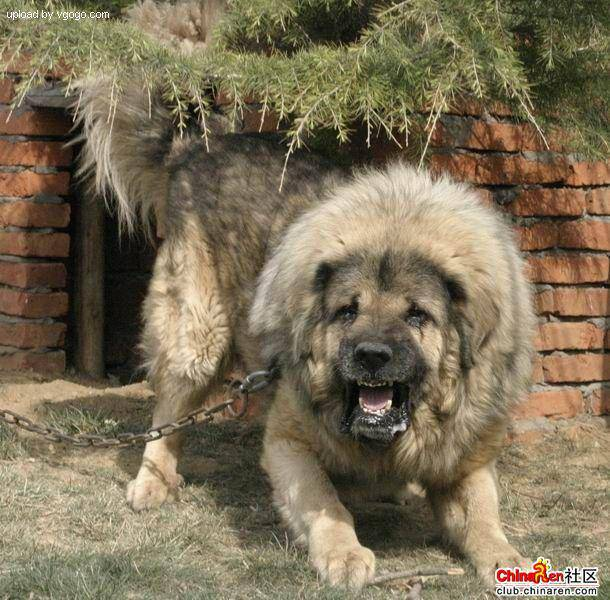

In [18]:
Image(filenames[9000])

In [19]:
data_label["breed"][9000]

'tibetan_mastiff'

In [20]:
labels=data_label["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [21]:
len(labels)

10222

In [22]:
if len(labels)==len(filenames):
    print("Number of labels matches number of filenames")
else:
    print("Number of labels does not match number of filenames")

Number of labels matches number of filenames


In [23]:
#unique label values
unique_breeds=np.unique(labels)
len(unique_breeds)

120

In [24]:
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [25]:
#turning every label into boolean array
boolean_label=[label== unique_breeds for label in labels]
boolean_label[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [26]:
len(boolean_label)

10222

In [27]:
#Turning boolean array into number
print(np.where(unique_breeds==labels[0]))
print(boolean_label[0].astype(int))

(array([19]),)
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [28]:
print(labels[2])
print(boolean_label[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


# Creating our Validation set
Kaggle Doesn't Provide with validation set so we will create our own

<img src="validation.png" width=50%>


In [29]:
x=filenames
y=boolean_label


In [30]:
# we will experiment with 1000 images

In [31]:
num_images=1000
from sklearn.model_selection import train_test_split
#splitting into training and validation 
np.random.seed(42)
x_train,x_val,y_train,y_val=train_test_split(x[:num_images],y[:num_images],test_size=0.20)
len(x_train),len(y_train),len(x_val),len(y_val)

(800, 800, 200, 200)

In [32]:
x[:2],y[:2]

(['train/000bec180eb18c7604dcecc8fe0dba07.jpg',
  'train/001513dfcb2ffafc82cccf4d8bbaba97.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False,  True, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, Fa

# Preprocessing images (Turing images into Tensors)

Tensors are numerical representations like matrix. They are similar to numpy arrays
I have created a function that will do:
1. Take an image filepath as input
2. use Tensorflow to read the file and save it to a variable, 'image'
3. Turn our 'image' (a jpg) into Tensors
4. Normalize our image (convert colour channels from (0-255) to [0,1))
5. Resize the 'image' to be a shape of (224,224)
6. Return the Modified image

In [33]:
from matplotlib.pyplot import imread
'''
A = imread( filename ) reads 
the image from the file specified by filename ,
inferring the format of the file from its contents. 
If filename is a multi-image file, then imread reads the first image in the file.
'''
image=imread(filenames[42])
image.shape # Height ,width and color channel(RGB (0-255))

(257, 350, 3)

In [34]:
image

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  53],
        [ 97,  88,  49],
        [120, 111,  72]]

In [35]:
#Turn image into a tensor
tf.constant(image)  #Creates a constant tensor from a tensor-like object. Now it can run in a GPU

Metal device set to: Apple M2


<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  5

In [36]:
img_size=224
# function for preprocessing:
def process_image(image_path):
    #Read an image file
    image=tf.io.read_file(image_path)
    #Turn the jpeg into numerical tensor with 3 colour channels (Red,Green,Blue)
    image=tf.image.decode_jpeg(image,channels=3)
    #convert the colour channel values from 0-255 to 0-1 values
    image=tf.image.convert_image_dtype(image,tf.float32)
    #Resize the image
    image=tf.image.resize(image,size=[img_size,img_size])
    return image

In [37]:
tensor=tf.io.read_file(filenames[26])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\xf4\x01w\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [38]:
tf.image.decode_jpeg(tensor,channels=3)[:2]

<tf.Tensor: shape=(2, 375, 3), dtype=uint8, numpy=
array([[[ 59,  68,  65],
        [ 64,  73,  70],
        [ 71,  80,  77],
        ...,
        [115, 128, 108],
        [115, 128, 108],
        [110, 123, 103]],

       [[ 65,  74,  71],
        [ 72,  81,  78],
        [ 79,  88,  85],
        ...,
        [114, 127, 107],
        [117, 130, 110],
        [116, 129, 109]]], dtype=uint8)>

# Batch is a small portion of your data
32 is the default batch size

Turning our data into batches
 
if we are trying to process 10000+ images in one go then they might not fit into the memory 

That's why we will do 32 (batch size) images at a time

In order to use TensorFlow data effectively, we need our data in the form of tensor tuples which look like 
(image,label)

In [39]:
#Turining into a tuple

def get_image_label(image_path,label):
    """
    Takes an image file path and the associated label, processes the image and 
    returns a tuple of (image,label).
    """
    image=process_image(image_path)
    return image,label
    
    

In [40]:
tf.constant(x[42]),tf.constant(y[42])

(<tf.Tensor: shape=(), dtype=string, numpy=b'train/011e06760794850c40f23d6426c40774.jpg'>,
 <tf.Tensor: shape=(120,), dtype=bool, numpy=
 array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
         True, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        Fal

In [41]:
batch_size=32
def create_data_batches(x,y=None,size=batch_size,valid_data=False,test_data=False):
    """
    create batches of data out of image (x) and label(y) pairs.
    shuffles the data if it is training data if it's training data but doesn't shuffle if it's validation data
    Also accepts test data as input(no labels)
    """
    # If the data is a test dataset , we probably dont have labels
    if test_data:
        data=tf.data.Dataset.from_tensor_slices(tf.constant(x))
        data_batch=data.map(process_image).batch(batch_size)
        return data_batch
    elif valid_data:
        print("Creating valid data batches")
        data=tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))
        data_batch=data.map(get_image_label).batch(batch_size)
        
        return data_batch
    else:
        print("Creating training data batch")
        data=tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))
        # we need to shuffle the pathnames and labels before mapping
        data=data.shuffle(buffer_size=len(x))
        data=data.map(get_image_label)
        data_batch=data.batch(batch_size)
    return data_batch
        
        
        
            
        
        
    

In [42]:
train_data=create_data_batches(x_train,y_train)
val_data=create_data_batches(x_val,y_val,valid_data=True)

Creating training data batch
Creating valid data batches


In [43]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

# Visualizing Data Batches


In [44]:
import matplotlib.pyplot as plt
# Create a function viewing images in a data batch
def show_25_images(images,labels):
    """
    Displays a plot of 25 images and their plot
    """
    plt.figure(figsize=(20,20))
    for i in range(25):
        # Subplot (5 rows, 5 columns)
        ax=plt.subplot(5,5,i+1)
        plt.imshow(images[i])
        # image label as the title
        plt.title(unique_breeds[labels[i].argmax()])
        #The numpy.argmax() function returns indices of the max element of the array in a particular axis. 


    
    

In [45]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [46]:
# Unbatching our data
train_images,train_labels=next(train_data.as_numpy_iterator()) 
#Return the next item from the iterator. If default is given and the iterator
#is exhausted, it is returned instead of raising StopIteration.
train_images,train_labels

2023-05-23 16:53:13.406510: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


(array([[[[9.60784376e-01, 6.54901981e-01, 5.05882382e-01],
          [9.60784376e-01, 6.54901981e-01, 5.05882382e-01],
          [9.60784376e-01, 6.54901981e-01, 5.05882382e-01],
          ...,
          [8.23844612e-01, 5.88550448e-01, 4.86589640e-01],
          [8.23529482e-01, 5.88235319e-01, 4.86274540e-01],
          [8.23529482e-01, 5.88235319e-01, 4.86274540e-01]],
 
         [[9.58876133e-01, 6.52993739e-01, 5.03974140e-01],
          [9.58876133e-01, 6.52993739e-01, 5.03974140e-01],
          [9.58876133e-01, 6.52993739e-01, 5.03974140e-01],
          ...,
          [8.23844612e-01, 5.88550448e-01, 4.86589640e-01],
          [8.23529482e-01, 5.88235319e-01, 4.86274540e-01],
          [8.23529482e-01, 5.88235319e-01, 4.86274540e-01]],
 
         [[9.54989552e-01, 6.49107158e-01, 5.00087559e-01],
          [9.54989552e-01, 6.49107158e-01, 5.00087559e-01],
          [9.54989552e-01, 6.49107158e-01, 5.00087559e-01],
          ...,
          [8.23844612e-01, 5.88550448e-01, 4.8658

In [47]:
len(train_images),len(train_labels)

(32, 32)

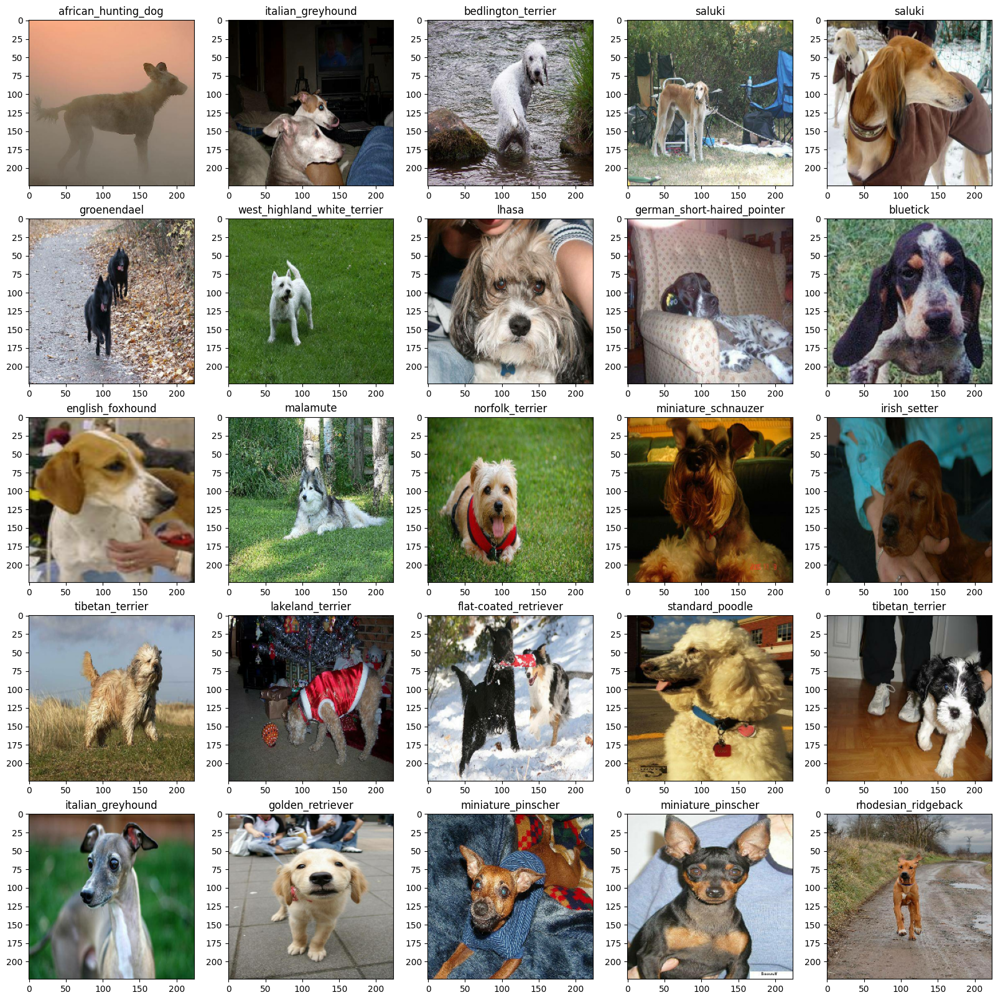

In [48]:
show_25_images(train_images,train_labels)

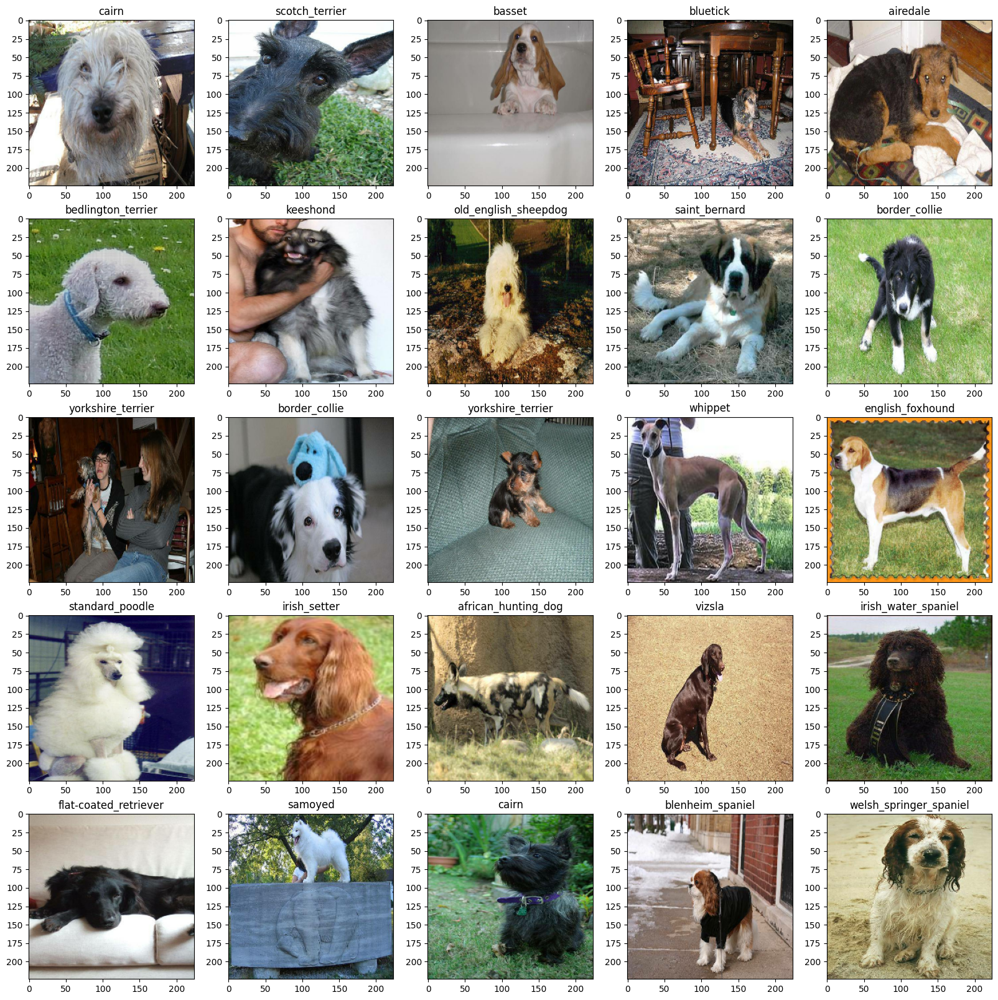

In [49]:
#Visualising Validation batch
val_images,val_labels=next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

<img src="tensorflow.jpg">

# Building a model
we need to define few things:
   1. The input shape(our images shape,in the form of tensors)
   2. The output shape (image labels,in the form of tensors)
   3. The URL of the model we want to use
 

In [50]:
#setting input shape to the model
Input= [None,img_size,img_size,3] #batch,height,width,color channels
Output= len(unique_breeds)
#Setup model URL from TensorFlow hub
#From image classification, text embeddings, audio, and video action recognition, 
#TensorFlow Hub is a space where you can browse trained models and datasets from across the TensorFlow ecosystem. 
Model_url="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"


# Creating a function that takes:
1. Input Shape ,output shape and model we have chosen as input
2. Defines the layers in a keras model in sequential fashion 
3. Compilation of model (Evaluation and improvement)
4. Builds the model
5. Return the model

# Follow this:
https://www.tensorflow.org/guide/keras/sequential_model

When choosing a layer in TensorFlow, consider the following steps:

Identify the problem: Determine the task you're trying to accomplish, such as classification, regression, or sequence generation.

Understand the data: Analyze the input and output data types, shapes, and dimensions. This will help you determine the appropriate layer types and configurations.

Consider layer compatibility: TensorFlow offers a wide range of layer types, including dense (fully connected), convolutional, recurrent, normalization, and more. Choose a layer that is suitable for your problem and compatible with your data.

Remember, there is no one-size-fits-all solution, and the choice of layers depends on the specific problem, data, and desired outcomes.






In [51]:
def create_model(input_shape=Input,output_shape=Output,model_url=Model_url):
    print("Building Model with:",model_url)
    
    #Setup model layers
    model =tf.keras.Sequential([
                                hub.KerasLayer(model_url),#Layer 1 (input layer)
                                tf.keras.layers.Dense(units=output_shape,activation="softmax")])#Layer 2(output layer)
    
    #Compile the model
    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(), #How well the model is guessing
        optimizer=tf.keras.optimizers.legacy.Adam(), #Adam Optimizer works well on most models other optimizer is RMBS prop
        metrics=["accuracy"]                         # Optimizers help to improve the model in each Epoch
    )  
    model.build(input_shape)
    return model

    

In [52]:
model=create_model()
model.summary()

Building Model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


<img src="activation.png">

# To detemine the Loss, use the table above or use the link below:
https://machinelearningmastery.com/how-to-choose-loss-functions-when-training-deep-learning-neural-networks/ 


# Creating Callbacks
callbacks are helper functions that we can use during training to do things such as save its progress, 
check its progress or to stop the model early if it stops improving

we will create two call backs one for TensorBoard which helps track our model progress and further for early stopping 
which prevents our model from training for too long

# Tensorboard callback
 Steps:
 1. Load themTensorBoard notebook Extension
 2. Create a Tensorboard callback which is able to save logs to a directory and pass it to the model's fit() function
 3. Visualize our models training logs with the %tensorboard magic function (we'll do this after model training )

In [53]:
%load_ext tensorboard

In [54]:
import datetime
import os
#Function to create a Tensorboard callBack
def tensorflow_callback():
    logdir=os.path.join("/Users/ujjwalbansal/Desktop/End_to_End_Dog_vision/Logs",datetime.datetime.now().strftime("%Y%D%M-%H%M%S"))
    return tf.keras.callbacks.TensorBoard(logdir) # Enable visualizations for TensorBoard.
                                                #TensorBoard is a visualization tool provided with TensorFlow.
                                                #This callback logs events for TensorBoard, including:


# Early stopping callback
Stop training when a monitored metric has stopped improving.
It prevents from Overfitting 
https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [55]:
early_stop=tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',patience=3) #(3 is the epochs)

# Training a model
First we will train our model on 1000 images to make sure that it is working

In [56]:
# Number of  Epochs is the number of passes our model is expected to do

In [57]:
num_epochs=100

In [58]:
# Checking for gpu
print("GPU available" if tf.config.list_physical_devices("GPU") else "not availble")

GPU available


# function which trains a model
1. Create  a model using create_model()
2. Setup tensorboard callback using tensorflow_callback()
3. call the fit() function on the model passing it the training data, number of epochs to train for (num_epochs)
    and the callback we will like to use
4. Return the model

In [59]:
def train_model():
    """
    Trains the model and returns the trained model
    """
    model=create_model()
    tensorboard=tensorflow_callback()
    model.fit(x=train_data,epochs=num_epochs,validation_data=val_data,validation_freq=1,
              callbacks=[tensorboard,early_stop]
             ) #freq is once for every epoch
    return model
    

In [60]:
model=train_model()
# Overfitting at the begining is a good thing, it means our model is learning

Building Model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 9s 295ms/step - loss: 4.6174 - accuracy: 0.0925 - val_loss: 3.3911 - val_accuracy: 0.3000
Epoch 2/100
25/25 [==============================] - 10s 405ms/step - loss: 1.6381 - accuracy: 0.6850 - val_loss: 2.2244 - val_accuracy: 0.5200
Epoch 3/100
25/25 [==============================] - 12s 468ms/step - loss: 0.5808 - accuracy: 0.9275 - val_loss: 1.7451 - val_accuracy: 0.5800
Epoch 4/100
25/25 [==============================] - 10s 404ms/step - loss: 0.2548 - accuracy: 0.9875 - val_loss: 1.5955 - val_accuracy: 0.6300
Epoch 5/100
25/25 [==============================] - 10s 392ms/step - loss: 0.1513 - accuracy: 0.9962 - val_loss: 1.5127 - val_accuracy: 0.6450
Epoch 6/100
25/25 [==============================] - 10s 404ms/step - loss: 0.1011 - accuracy: 0.9987 - val_loss: 1.4674 - val_accuracy: 0.6500
Epoch 7/100
25/25 [=========================

In [61]:
model.history

In [62]:
#Vusualizing Log Directories
%tensorboard --logdir /Users/ujjwalbansal/Desktop/End_to_End_Dog_vision/Logs

In [63]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [205]:
prediction=model.predict(val_data)

7/7 [==============================] - 5s 738ms/step


In [206]:
prediction #It gives the probablity of finding each breed as we have applied softmax so each component will be 
          # between 0 and 1 and all these values will sum up to 1 

array([[9.88712345e-05, 1.25665960e-04, 1.73621462e-03, ...,
        1.68652463e-04, 1.79720839e-04, 2.72362703e-03],
       [9.90194967e-04, 1.70666643e-03, 1.25292502e-02, ...,
        7.03454018e-04, 1.49575458e-03, 5.59100517e-05],
       [5.56126470e-05, 1.28500847e-04, 1.96200908e-05, ...,
        1.27585463e-05, 4.68474627e-06, 8.12247221e-04],
       ...,
       [1.10155952e-05, 7.66053854e-05, 3.37593119e-05, ...,
        2.45068418e-06, 2.47261400e-04, 3.22896885e-05],
       [1.06848951e-03, 1.00128142e-04, 1.16181116e-04, ...,
        8.32599835e-05, 6.30670111e-04, 6.41139364e-03],
       [6.24881432e-05, 1.50444439e-05, 3.02909437e-04, ...,
        5.84648969e-03, 4.44479781e-04, 1.37601484e-04]], dtype=float32)

In [207]:
prediction.shape

(200, 120)

In [208]:
len(y_val)

200

In [209]:
len(unique_breeds)

120

In [216]:
np.sum(prediction[0])

1.0

In [230]:
index=170
print(f"Max Prediction value (Max Probablity){np.max(prediction[index])}")
print(f"Max index: {np.argmax(prediction[index])}")
print(f"Predicted Label:{unique_breeds[np.argmax(prediction[index])]}")

Max Prediction value (Max Probablity)0.7543002367019653
Max index: 95
Predicted Label:schipperke


In [231]:
unique_breeds[95]

'schipperke'

In [232]:
# Prediction Probablities are also known as confidence levels

In [93]:
# Turn prediction probablities into their respective label
def get_pred_label(prediction_prob):
    return unique_breeds[np.argmax(prediction_prob)]

In [94]:
pred_lablel=get_pred_label(prediction[81])
pred_lablel

NameError: name 'prediction' is not defined

# Unbatching a data
Since our valid data is in a batch , we will habe to unbatch it to make predcition on the validation images and then compare those predictions on the validation labels(truth labels)

In [341]:
def unbatchify(data):
    """
    Takes a Batched dataset of (image,label) Tensors and returns seperate arrays of images
    and labels
    """
    images=[]
    labels=[]
    for image,label in val_data.unbatch().as_numpy_iterator():
        images.append(image)
        labels.append(unique_breeds[np.argmax(label)])
        return images,labels

#unbatchify  the validation data
val_images,val_labels=unbatchify(val_data)

In [345]:
get_pred_label(val_images[0])

'vizsla'

Now we have got
1. Prediction Labels
2. Validation Labels
3. Validation Images

A function to make all these visualize more


In [409]:
def plot_pred(prediction_prob,labels,images):
    """
    View the Prediction , ground truth,and image for sample n
    """
    pred_prob,true_label,image=prediction_prob[0],labels[0],images[0]
    pred_label=get_pred_label(pred_prob)
    plt.imshow(image)
    rounded_prob = format(np.max(pred_prob)*100, ".2f") 
    plt.title(rounded_prob+"%")
    

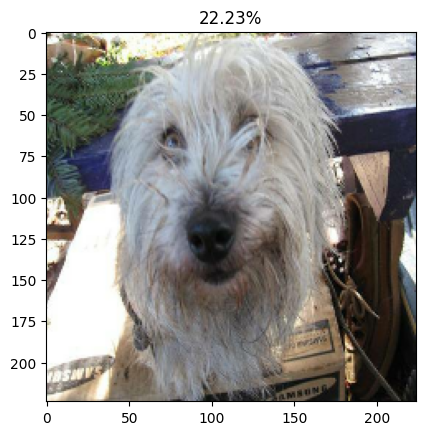

In [410]:
plot_pred(prediction_prob=prediction,labels=labels,images=images)

In [417]:
# Top 10 prediction confidence intervals
n=0
top_10_pred_indexes=prediction[n].argsort()[-10:][::-1]
top_10_pred_values=prediction[n][top_10_pred_indexes]
top_10_pred_labels=unique_breeds[top_10_pred_indexes]

In [418]:
top_10_pred,top_10_pred_values,top_10_pred_labels

(array([ 26,  70,  59,  17,  73, 103,   6, 102, 109,  65]),
 array([0.2223313 , 0.19614092, 0.14974801, 0.14017326, 0.06258644,
        0.04065135, 0.0282815 , 0.02741664, 0.0261949 , 0.01496175],
       dtype=float32),
 array(['cairn', 'lhasa', 'irish_wolfhound', 'border_terrier',
        'maltese_dog', 'soft-coated_wheaten_terrier', 'australian_terrier',
        'silky_terrier', 'tibetan_terrier', 'komondor'], dtype=object))

([<matplotlib.axis.XTick at 0x2c5dd29e0>,
 [Text(0, 0, 'cairn'),
  Text(1, 0, 'lhasa'),
  Text(2, 0, 'irish_wolfhound'),
  Text(3, 0, 'border_terrier'),
  Text(4, 0, 'maltese_dog'),
  Text(5, 0, 'soft-coated_wheaten_terrier'),
  Text(6, 0, 'australian_terrier'),
  Text(7, 0, 'silky_terrier'),
  Text(8, 0, 'tibetan_terrier'),
  Text(9, 0, 'komondor')])

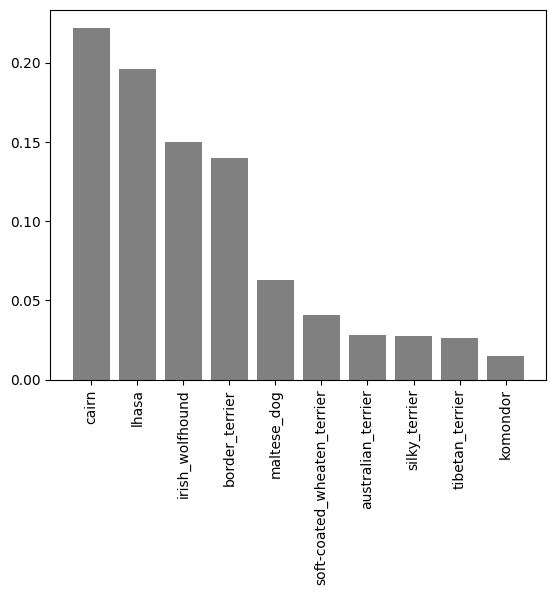

In [419]:
plt.bar(np.arange(len(top_10_pred_labels)),top_10_pred_values,color="grey")
plt.xticks(np.arange(len(top_10_pred_labels)),labels=top_10_pred_labels,rotation="vertical")

# Saving and reloading a trained model

In [66]:
def save_model(model,suffix=None):
    modeldir=os.path.join("/Users/ujjwalbansal/Desktop/End_to_End_Dog_vision/Model",
                          datetime.datetime.now().strftime("%Y%D%M-%H%M%S"))
    model_path=modeldir+"-"+suffix+".h5"
    print(f"saving model to {model_path}")
    model.save(model_path)
    return model_path
    

In [67]:
def load_model(model_path):
    print(f"Loading the model from : {model_path}")
    model=tf.keras.models.load_model(model_path,custom_objects={"KerasLayer":hub.KerasLayer})
    return model

    
    
    

In [462]:
save_model(model,suffix="Trained_on_1000_images")

saving model to /Users/ujjwalbansal/Desktop/End_to_End_Dog_vision/Model/202305/23/2348-124838-Trained_on_1000_images.h5


'/Users/ujjwalbansal/Desktop/End_to_End_Dog_vision/Model/202305/23/2348-124838-Trained_on_1000_images.h5'

In [465]:
load_100_image_model=load_model("/Users/ujjwalbansal/Desktop/End_to_End_Dog_vision/Model/202305/23/2348-124838-Trained_on_1000_images.h5")

Loading the model from : /Users/ujjwalbansal/Desktop/End_to_End_Dog_vision/Model/202305/23/2348-124838-Trained_on_1000_images.h5


In [466]:
load_100_image_model.evaluate(val_data)

7/7 [==============================] - 6s 230ms/step - loss: 1.2625 - accuracy: 0.6800


[1.2625415325164795, 0.6800000071525574]

In [467]:
model.evaluate(val_data)

7/7 [==============================] - 2s 272ms/step - loss: 1.2625 - accuracy: 0.6800


[1.2625415325164795, 0.6800000071525574]

# Training on full data

In [474]:
len(x),len(y)

(10222, 10222)

In [475]:
len(x_train)

800

In [477]:
# Batch with full data set
full_data= create_data_batches(x,y)

Creating training data batch


In [478]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [479]:
full_model=create_model()

Building Model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [70]:
# creating Callbacks
full_model_tensorboard=tensorflow_callback()
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor="accuracy",patience=3)

In [483]:
full_model.fit(x=full_data,epochs=num_epochs,callbacks=[full_model_tensorboard,full_model_early_stopping])


Epoch 1/100
320/320 [==============================] - 43s 131ms/step - loss: 1.3393 - accuracy: 0.6744
Epoch 2/100
320/320 [==============================] - 42s 131ms/step - loss: 0.4036 - accuracy: 0.8805
Epoch 3/100
320/320 [==============================] - 76s 238ms/step - loss: 0.2398 - accuracy: 0.9329
Epoch 4/100
320/320 [==============================] - 97s 303ms/step - loss: 0.1539 - accuracy: 0.9627
Epoch 5/100
320/320 [==============================] - 88s 275ms/step - loss: 0.1067 - accuracy: 0.9798
Epoch 6/100
320/320 [==============================] - 88s 274ms/step - loss: 0.0774 - accuracy: 0.9864
Epoch 7/100
320/320 [==============================] - 87s 273ms/step - loss: 0.0578 - accuracy: 0.9925
Epoch 8/100
320/320 [==============================] - 89s 278ms/step - loss: 0.0457 - accuracy: 0.9946
Epoch 9/100
320/320 [==============================] - 89s 279ms/step - loss: 0.0378 - accuracy: 0.9957
Epoch 10/100
320/320 [==============================] - 90s 281m

In [102]:
save_model(full_model,suffix="Fully_Trained_model")

NameError: name 'full_model' is not defined

In [71]:
#Loading full model
load_full_model=load_model("/Users/ujjwalbansal/Desktop/End_to_End_Dog_vision/Model/202305/23/2330-133010-Fully_Trained_model.h5")

Loading the model from : /Users/ujjwalbansal/Desktop/End_to_End_Dog_vision/Model/202305/23/2330-133010-Fully_Trained_model.h5


# Making Predictions on test dataset
Since our model is trained in the form of Tensor batches,to make predictions on test data we will have to make it in same format

1. Get the test image filenames
2. convert the filenames into test data batches using create_data_batches() and setting the test_data parameter to be true (since test data doesn't have labels)
3. Make a predictions array by passing the test batches to the  predict() method on our model

In [72]:
test_path="/Users/ujjwalbansal/Desktop/End_to_End_Dog_vision/test/"
test_filenames=[test_path+fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/Users/ujjwalbansal/Desktop/End_to_End_Dog_vision/test/266490a2b053a4a3bf68e779f28fb5a9.jpg',
 '/Users/ujjwalbansal/Desktop/End_to_End_Dog_vision/test/dae9fd18836d8df20989ef0101771d4b.jpg',
 '/Users/ujjwalbansal/Desktop/End_to_End_Dog_vision/test/079a40f22b0fad9a66f76797b62bb930.jpg',
 '/Users/ujjwalbansal/Desktop/End_to_End_Dog_vision/test/ab8462f9a501d362041d47582fddc9ad.jpg',
 '/Users/ujjwalbansal/Desktop/End_to_End_Dog_vision/test/8895089b432e020cc42e6262b5a1c2dd.jpg',
 '/Users/ujjwalbansal/Desktop/End_to_End_Dog_vision/test/985ae7fc271ac4a0d131e546c0f95bb6.jpg',
 '/Users/ujjwalbansal/Desktop/End_to_End_Dog_vision/test/77c1ab99cffb817d54fb14f229aeb118.jpg',
 '/Users/ujjwalbansal/Desktop/End_to_End_Dog_vision/test/ad7e50abca9b7c6a88b63946c5bbe493.jpg',
 '/Users/ujjwalbansal/Desktop/End_to_End_Dog_vision/test/d61a09cecf56666cdb315ebce4b93c43.jpg',
 '/Users/ujjwalbansal/Desktop/End_to_End_Dog_vision/test/cb120c57904e8c0694bbe259c58a873c.jpg']

In [499]:
len(test_filenames)

10357

In [500]:
test_data=create_data_batches(test_filenames,test_data=True)
test_data #no labels

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [501]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [521]:
test_prediction=load_full_model.predict(test_data,verbose=1)

 41/324 [==>...........................] - ETA: 1:57

KeyboardInterrupt: 

In [522]:
unique_breeds[np.argmax(test_prediction[2])]

'newfoundland'

In [523]:
test_prediction.shape

(10357, 120)

# Preparing test dataset predictions for Kaggle


In [524]:
# Create pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [528]:
os.path.splitext(test_filenames[0]) #Splits test file and format

('/Users/ujjwalbansal/Desktop/End_to_End_Dog_vision/test/266490a2b053a4a3bf68e779f28fb5a9',
 '.jpg')

In [8]:
test_path = "/Users/ujjwalbansal/Desktop/End_to_End_Dog_vision/test/"
preds_df["id"] = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df.head()

NameError: name 'preds_df' is not defined

In [527]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_prediction
preds_df.head()


,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,266490a2b053a4a3bf68e779f28fb5a9,9.657074e-10,6.046851e-06,3.826249e-09,1.357436e-06,2.316822e-11,1.914929e-06,3.218199e-11,5.998030e-11,6.721247e-04,...,8.697233e-10,1.689513e-09,7.580721e-05,4.655830e-06,4.844471e-07,9.047419e-13,2.013558e-09,9.169812e-06,5.345052e-10,4.142395e-11
1,dae9fd18836d8df20989ef0101771d4b,7.769242e-03,7.031284e-04,1.050298e-05,2.864664e-07,3.630606e-07,3.379280e-07,2.839457e-03,2.428282e-09,2.088263e-07,...,2.010440e-07,9.553182e-07,1.890880e-07,2.813583e-05,4.460577e-05,1.421197e-10,1.159316e-06,3.612488e-06,7.100004e-07,6.733694e-08
2,079a40f22b0fad9a66f76797b62bb930,1.488734e-07,5.692993e-11,5.509412e-12,8.470329e-11,3.822464e-11,7.456408e-11,4.193456e-11,2.620574e-11,3.688761e-12,...,1.486149e-12,5.401231e-12,4.056927e-11,1.213086e-10,1.389413e-10,2.167820e-12,2.431870e-12,1.126725e-11,3.732362e-12,2.533485e-11
3,ab8462f9a501d362041d47582fddc9ad,7.687844e-10,2.710896e-08,8.377582e-12,3.306168e-08,3.685505e-11,8.342587e-08,5.909607e-09,7.958573e-12,5.631996e-09,...,3.734257e-09,6.300073e-10,3.520402e-10,4.274812e-08,3.747576e-10,6.127525e-07,9.610185e-10,1.098223e-09,1.282248e-12,8.501450e-07
4,8895089b432e020cc42e6262b5a1c2dd,9.312068e-11,3.347727e-10,9.335772e-09,1.199639e-11,2.532358e-09,5.247009e-09,1.084409e-07,2.072882e-04,5.205345e-06,...,8.951616e-10,1.274674e-08,8.103729e-10,8.558622e-11,8.926657e-11,1.101604e-08,1.775328e-08,5.354657e-08,1.887412e-08,7.440088e-12


In [529]:
preds_df.to_csv("/Users/ujjwalbansal/Desktop/End_to_End_Dog_vision/kaggle_submission_ujjwal.csv",
                 index=False)

In [4]:
# Testing on custom images
import os

In [96]:
custom_path = "/Users/ujjwalbansal/Desktop/End_to_End_Dog_vision/custom/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]
custom_image_paths

['/Users/ujjwalbansal/Desktop/End_to_End_Dog_vision/custom/1.jpeg',
 '/Users/ujjwalbansal/Desktop/End_to_End_Dog_vision/custom/2.jpeg',
 '/Users/ujjwalbansal/Desktop/End_to_End_Dog_vision/custom/3.jpeg']

In [97]:
# Turn custom image into batch (set to test data because there are no labels)
custom_data = create_data_batches(custom_image_paths, test_data=True)
# Make predictions on the custom data
custom_preds = load_full_model.predict(custom_data)


1/1 [==============================] - 1s 743ms/step


In [98]:
custom_preds # Now we've got some predictions arrays, let's convert them to labels and compare them with each image.



array([[1.10486870e-10, 7.82698066e-07, 7.37560235e-10, 3.71348674e-10,
        1.39616363e-09, 3.26604403e-11, 9.26565491e-11, 8.55935277e-13,
        6.61714850e-11, 3.44094406e-11, 1.20028716e-07, 2.88458923e-10,
        1.03914061e-07, 1.09832206e-06, 2.28642272e-10, 8.99134545e-09,
        1.67242487e-11, 1.52958659e-08, 9.88103710e-10, 7.80579854e-12,
        6.39462872e-10, 2.14185909e-11, 2.71150963e-10, 7.58269270e-09,
        2.18119368e-07, 1.37959102e-08, 1.28385053e-10, 1.27160539e-11,
        1.44162514e-05, 1.67657110e-10, 1.59009916e-10, 2.54734601e-07,
        3.58833070e-08, 3.86764648e-10, 1.97129655e-08, 2.13661224e-06,
        2.95874067e-12, 6.35253230e-14, 1.51050158e-10, 1.29832824e-06,
        5.35543149e-05, 5.68995406e-10, 1.99171140e-07, 2.11275615e-11,
        5.96261998e-06, 3.23887223e-10, 2.44806389e-12, 3.56540511e-07,
        4.60370302e-08, 9.89732444e-01, 9.27606048e-10, 5.95702643e-09,
        6.38895825e-09, 2.82392804e-10, 5.04801550e-14, 1.397353

In [99]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['golden_retriever', 'golden_retriever', 'pomeranian']

In [100]:
# Get custom images (our unbatchify() function won't work since there aren't labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
    custom_images.append(image)

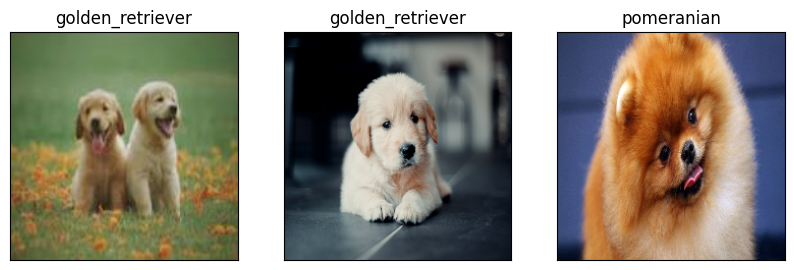

In [101]:
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
    plt.subplot(1, 3, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.title(custom_pred_labels[i])
    plt.imshow(image)